# Importing Libraries

In [5]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix

In [6]:
!pip install -q torchinfo
from torchinfo import summary

# Walking through Data Directory

In [7]:
data_dir = "/kaggle/input/animal-image-dataset-90-different-animals/animals/animals"

In [8]:
def walk_through_dir(dir_path):
    image_folders_dir = []
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'")
        if len(filenames) != 0:
            image_folders_dir.append(dirpath)
    return image_folders_dir

In [9]:
image_folders_dir = walk_through_dir(data_dir)

There are 90 directories and 0 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/beetle'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/parrot'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/fox'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/wolf'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/hedgehog'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/turtle'
There are 0 directories and 60 images in '/kaggle/input/animal-image-dataset-90-different-animals/animals/animals/snake'
There are 0 directories and 60 imag

# Visualizing Random Images

### Using Pillow Library

In [10]:
def random_image_display(seed=42):
    random.seed(seed)
    rand_img_folder = random.choice(image_folders_dir)
    rand_image_path = os.path.join(rand_img_folder, random.choice(os.listdir(rand_img_folder)))
    print(f"Image Path is {rand_image_path}")
    image_class = rand_image_path.split('/')[-2]
    print(f"Image Class is {image_class}")
    img = Image.open(rand_image_path)
    print(f"Image Height: {img.height} || Image Width: {img.width}")
    return img, image_class

Image Path is /kaggle/input/animal-image-dataset-90-different-animals/animals/animals/leopard/20a83ea83f.jpg
Image Class is leopard
Image Height: 174 || Image Width: 290


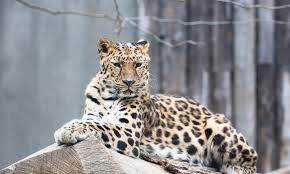

In [11]:
img, image_class = random_image_display()
img

### Using Matplotlib

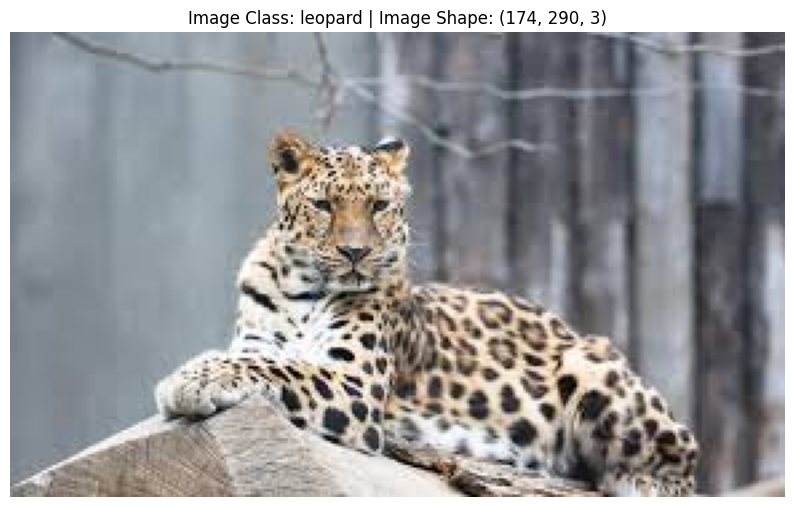

In [12]:
img_as_arr = np.asarray(img)

plt.figure(figsize=(10, 7))
plt.imshow(img_as_arr)
plt.title(f"Image Class: {image_class} | Image Shape: {img_as_arr.shape}")
plt.axis(False);

# Setting up device agnostic code

In [13]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [14]:
!nvidia-smi

Tue Mar  5 13:24:01 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.129.03             Driver Version: 535.129.03   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              26W / 250W |      2MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Setting up helper functions

In [15]:
def create_dataloaders(dataset, n_splits=3, batch_size=16):
    train_dataloaders = []
    test_dataloaders = []
    
    kfold = KFold(n_splits=n_splits, shuffle=True)
    
    for fold, (train_ids, test_ids) in enumerate(kfold.split(dataset)):
        train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
        train_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=train_subsampler, pin_memory=True, num_workers=os.cpu_count())
        test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
        test_dataloader = DataLoader(dataset, batch_size=batch_size, sampler=test_subsampler, pin_memory=True, num_workers=os.cpu_count())
        train_dataloaders.append(train_dataloader)
        test_dataloaders.append(test_dataloader)
    return train_dataloaders, test_dataloaders

In [16]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device=device):
    model.train()

    train_loss, train_acc = 0, 0
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        y_pred = model(X)

        loss = loss_fn(y_pred, y)
        train_loss += loss.item()
        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)

        train_acc += (y_pred_class == y).sum().item() / len(y_pred)


    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)

    return train_loss, train_acc

In [17]:
def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device=device):

    model.eval()

    test_loss, test_acc = 0, 0
    labels, predictions = [], []
    with torch.inference_mode():
        for batch, (X, y) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)

            test_pred_logits = model(X)
            loss = loss_fn(test_pred_logits, y)

            test_loss += loss.item()

            test_pred_labels = test_pred_logits.argmax(dim=1)

            test_acc += ((test_pred_labels == y).sum().item() / len(test_pred_labels))
            
            labels.extend(y.cpu().numpy())
            predictions.extend(test_pred_labels.cpu().numpy())
    test_loss = test_loss / len(dataloader)

    test_acc = test_acc / len(dataloader)

    return test_loss, test_acc, labels, predictions

In [18]:
def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module = nn.CrossEntropyLoss(),
          epochs: int = 5,
          device=device):

    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []}

    for epoch in range(epochs):
        train_loss, train_acc = train_step(model=model,
                                           dataloader=train_dataloader,
                                           loss_fn=loss_fn,
                                           optimizer=optimizer,
                                           device=device)

        test_loss, test_acc, labels, predictions = test_step(model=model,
                                                             dataloader=test_dataloader,
                                                             loss_fn=loss_fn,
                                                             device=device)


        print(f"Epoch: {epoch} | Train loss: {train_loss:.4f} | Train acc: {train_acc:.4f} | Test loss: {test_loss:.4f} | Test acc: {test_acc:.4f}")

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)        
    return results, labels, predictions

In [19]:
def save_loss_curves_ovr(results):
    folder_dir = "/kaggle/working/OnevsRestPrediction"
    directory = os.path.join(folder_dir,f"results_{results['One Label']}")
    os.makedirs(directory, exist_ok=True)
    for fold in results['results']:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=100)
        axs[0].plot(results['results'][fold]['train_loss'], label='Train Loss', color='red')
        axs[0].plot(results['results'][fold]['test_loss'], label='Test Loss', color='blue')
        axs[0].set_title(f"Loss Curve for Dataset: {results['One Label']} for Fold: {fold+1}")
        axs[0].set_xlabel("Epoch")
        axs[0].set_ylabel("Loss")
        axs[0].legend()
        axs[1].plot(results['results'][fold]['train_acc'], label='Train Accuracy', color='red')
        axs[1].plot(results['results'][fold]['test_acc'], label='Test Accuracy', color='blue')
        axs[1].set_title(f"Accuracy Curve for Dataset: {results['One Label']} for Fold: {fold+1}")
        axs[1].set_xlabel("Epoch")
        axs[1].set_ylabel("Loss")
        axs[1].legend()
        plt.savefig(os.path.join(directory, f'{fold+1}.png'))

In [20]:
def save_loss_curves_5class(results, filename):
    folder_dir = "/kaggle/working/fiveclass_Prediction"
    directory = os.path.join(folder_dir,filename)
    os.makedirs(directory, exist_ok=True)
    for fold in results['results']:
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=100)
        axs[0].plot(results['results'][fold]['train_loss'], label='Train Loss', color='red')
        axs[0].plot(results['results'][fold]['test_loss'], label='Test Loss', color='blue')
        axs[0].set_title(f"Loss Curve for Dataset: {filename} for Fold: {fold+1}")
        axs[0].set_xlabel("Epoch")
        axs[0].set_ylabel("Loss")
        axs[0].legend()
        axs[1].plot(results['results'][fold]['train_acc'], label='Train Accuracy', color='red')
        axs[1].plot(results['results'][fold]['test_acc'], label='Test Accuracy', color='blue')
        axs[1].set_title(f"Accuracy Curve for Dataset: {filename} for Fold: {fold+1}")
        axs[1].set_xlabel("Epoch")
        axs[1].set_ylabel("Loss")
        axs[1].legend()
        plt.savefig(os.path.join(directory, f'{fold+1}.png'))

# One Vs Rest Classification

## Creating a Custom Dataset for one vs rest classification

In [21]:
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 data_dir_path: str,
                 one_idx: int, 
                 transforms=None):
        class_names = os.listdir(data_dir_path)
        one_class_name = class_names[one_idx]
        self.transforms = transforms
        self.images = []
        self.labels = []
        
        for class_name in class_names:
            if class_name == one_class_name:
                img_percent = 1
            else:
                img_percent = 0.1
                
            folder_path = os.path.join(data_dir_path, class_name)
            for i, img_id in enumerate(os.listdir(folder_path)):
                if i >= img_percent*len(os.listdir(folder_path)):
                    break
                img_path = os.path.join(folder_path, img_id)
                self.images.append(os.path.join(folder_path, img_id))
                if class_name == one_class_name:
                    self.labels.append(1)
                else:
                    self.labels.append(0)
    
    def load_image(self, index:int):
        return Image.open(self.images[index])
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index:int):
        img = self.load_image(index)
        label = self.labels[index]
        if self.transforms != None:
            return self.transforms(img), torch.tensor(label, dtype=torch.long)
        return img, label

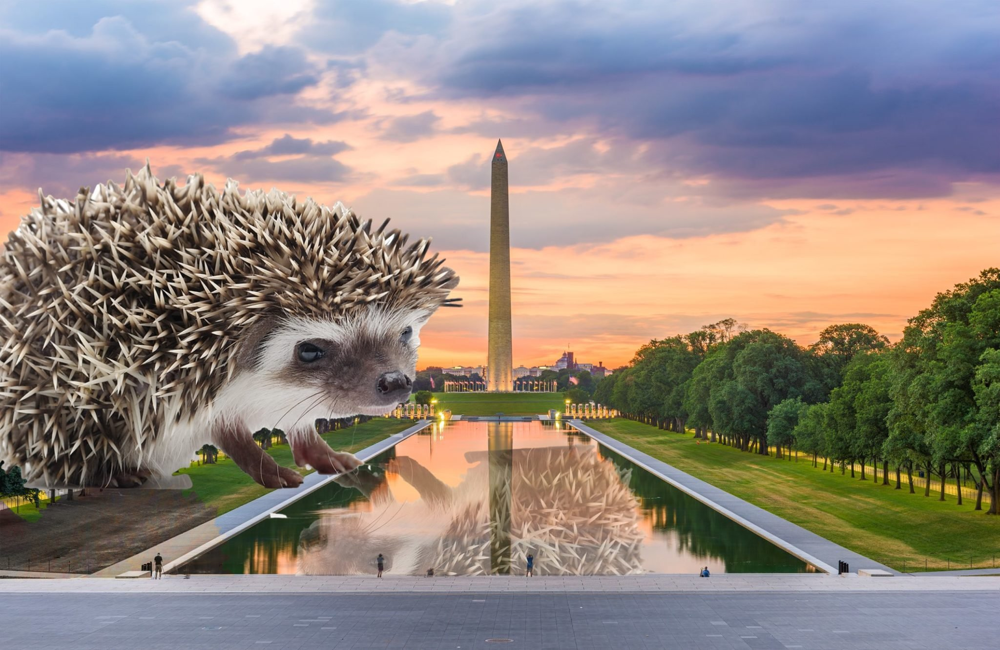

In [22]:
ovrdataset = CustomDataset(data_dir_path=data_dir, one_idx=10)
ovrdataset.load_image(random.choice(range(0, len(ovrdataset))))

## Creating the Classification Function

In [23]:
def one_vs_rest_classification(data_dir, index, model, model_name, device, transforms, optimizer, loss_function, epochs=3, n_splits=3, batch_size=16):
    one_vs_rest_results = {}
    print("One Label: ", os.listdir(data_dir)[index])
    dataset = CustomDataset(data_dir, index, transforms)
    train_dataloaders, test_dataloaders = create_dataloaders(dataset, n_splits, batch_size)
    each_fold_results = {}
    for fold in range(n_splits):
        train_dataloader = train_dataloaders[fold]
        test_dataloader = test_dataloaders[fold]
            
        model.to(device)
            
        results, labels, predictions = train(model,
                                             train_dataloader,
                                             test_dataloader,
                                             optimizer=optimizer,
                                             loss_fn=loss_function,
                                             epochs=epochs,
                                             device=device)
        each_fold_results[fold] = results
        print(f"For Fold - {fold+1}")
        print(confusion_matrix(labels, predictions))
        
    
    one_vs_rest_results["Model"] = model_name
    one_vs_rest_results["One Label"] = os.listdir(data_dir)[index]
    one_vs_rest_results["results"] = each_fold_results
    
    return one_vs_rest_results

## Getting a Pre-trained Model

In [24]:
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

torch.manual_seed(42)
torch.cuda.manual_seed(42)
pretrained_vit.heads = nn.Linear(in_features=768,
                                 out_features=2).to(device)

Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth
100%|██████████| 330M/330M [00:02<00:00, 157MB/s] 


In [25]:
summary(model=pretrained_vit,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 2]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

## Creating Transforms, Loss function and Optimizers

In [29]:
ovr_transforms = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            ])

In [30]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=3e-3,
                             betas=(0.9, 0.999),
                             weight_decay=0.3)

## Running the model and saving the loss curves

In [32]:
index = random.choice(range(90))
ovr_results = one_vs_rest_classification(data_dir, index, pretrained_vit,'Pretrained ViT', device, ovr_transforms, optimizer, loss_function, epochs=3, n_splits=3)

One Label:  hippopotamus
Epoch: 0 | Train loss: 0.1582 | Train acc: 0.9525 | Test loss: 0.0320 | Test acc: 1.0000
Epoch: 1 | Train loss: 0.0402 | Train acc: 0.9950 | Test loss: 0.0502 | Test acc: 0.9952
Epoch: 2 | Train loss: 0.0577 | Train acc: 0.9925 | Test loss: 0.0494 | Test acc: 1.0000
For Fold - 1
[[177   0]
 [  0  21]]
Epoch: 0 | Train loss: 0.0547 | Train acc: 1.0000 | Test loss: 0.0418 | Test acc: 0.9952
Epoch: 1 | Train loss: 0.0497 | Train acc: 0.9925 | Test loss: 0.0489 | Test acc: 0.9952
Epoch: 2 | Train loss: 0.0537 | Train acc: 0.9950 | Test loss: 0.0538 | Test acc: 0.9952
For Fold - 2
[[182   1]
 [  0  15]]
Epoch: 0 | Train loss: 0.0457 | Train acc: 0.9975 | Test loss: 0.0664 | Test acc: 0.9856
Epoch: 1 | Train loss: 0.0460 | Train acc: 0.9975 | Test loss: 0.0791 | Test acc: 0.9760
Epoch: 2 | Train loss: 0.0459 | Train acc: 0.9975 | Test loss: 0.0996 | Test acc: 0.9663
For Fold - 3
[[174   0]
 [  7  17]]


In [33]:
ovr_results

{'Model': 'Pretrained ViT',
 'One Label': 'hippopotamus',
 'results': {0: {'train_loss': [0.15817770920693874,
    0.040195073895156384,
    0.057655328065156934],
   'train_acc': [0.9525, 0.995, 0.9925],
   'test_loss': [0.03198552432541664,
    0.05015528087432568,
    0.049428679335575834],
   'test_acc': [1.0, 0.9951923076923077, 1.0]},
  1: {'train_loss': [0.054686497077345846,
    0.04970060259103775,
    0.05372280582785607],
   'train_acc': [1.0, 0.9925, 0.995],
   'test_loss': [0.041786249655370526,
    0.04885828495025635,
    0.05375422666279169],
   'test_acc': [0.9951923076923077, 0.9951923076923077, 0.9951923076923077]},
  2: {'train_loss': [0.0457355959713459,
    0.04595082387328148,
    0.04588931396603584],
   'train_acc': [0.9975, 0.9975, 0.9975],
   'test_loss': [0.06635127703730877,
    0.07908979488106874,
    0.09961567733150262],
   'test_acc': [0.9855769230769231, 0.9759615384615384, 0.9663461538461539]}}}

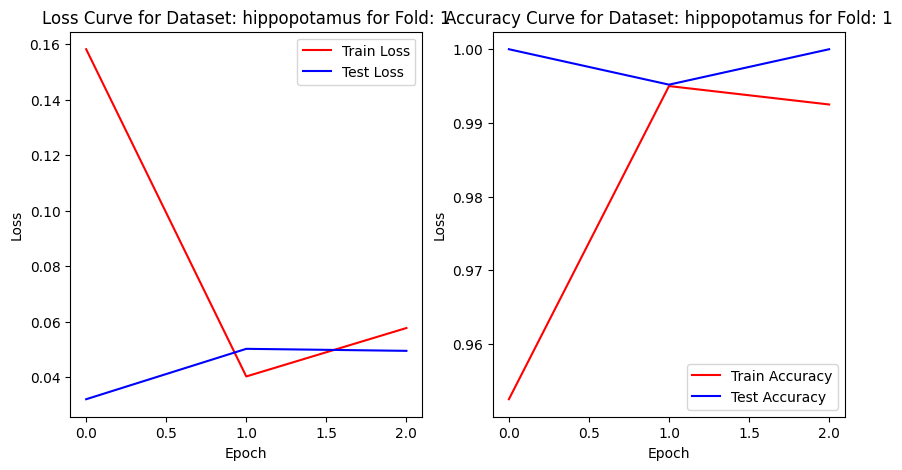

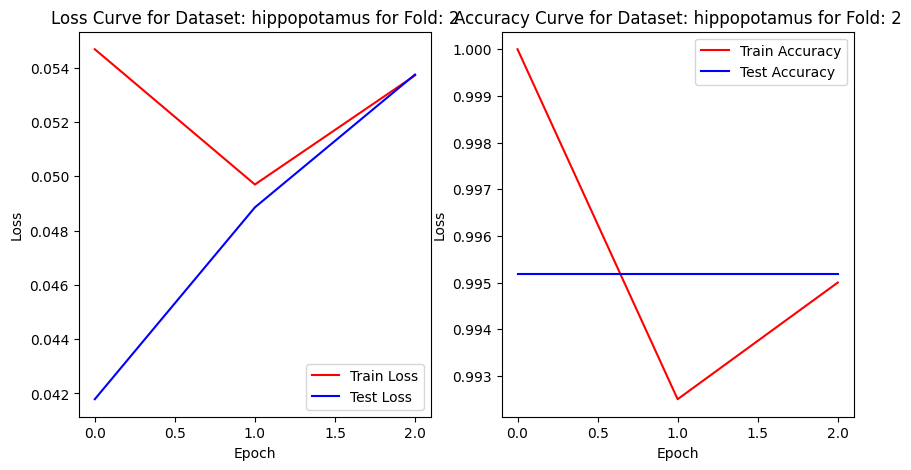

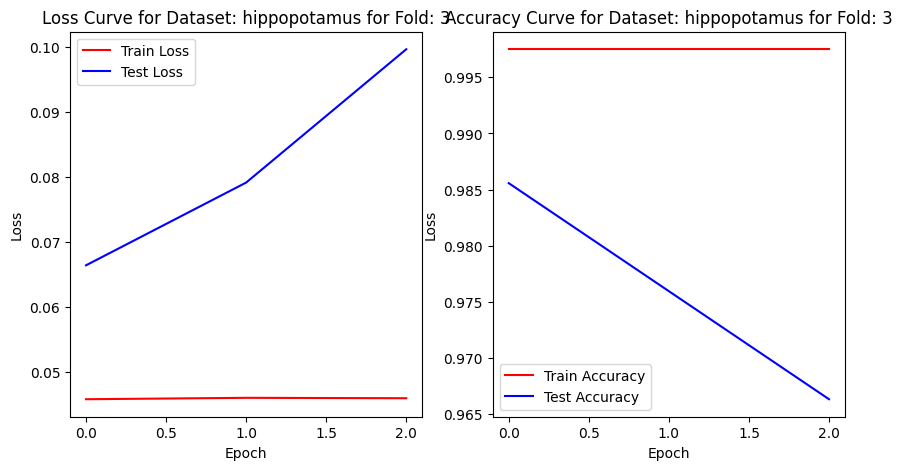

In [34]:
save_loss_curves_ovr(ovr_results)

# 5-class Classification

## Creating a Custom Dataset for 5 class classification

In [35]:
class CustomDataset_5class(torch.utils.data.Dataset):
    def __init__(self, 
                 data_dir_path: str,
                 list_idxs, 
                 transforms=None):
        class_names = os.listdir(data_dir_path)
        group_class_names = [class_names[i] for i in list_idxs]
        self.transforms = transforms
        self.images = []
        self.labels = []
        
        for class_name in class_names:
            if class_name in group_class_names:
                img_percent = 1
            else:
                img_percent = 0.1
                
            folder_path = os.path.join(data_dir_path, class_name)
            for i, img_id in enumerate(os.listdir(folder_path)):
                if i >= img_percent*len(os.listdir(folder_path)):
                    break
                img_path = os.path.join(folder_path, img_id)
                self.images.append(os.path.join(folder_path, img_id))
                if class_name in group_class_names:
                    for lb in range(len(list_idxs)):
                        if (class_name == group_class_names[lb]):
                            self.labels.append(lb+1)
                else:
                    self.labels.append(0)
    
    def load_image(self, index:int):
        return Image.open(self.images[index])
        
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index:int):
        img = self.load_image(index)
        label = self.labels[index]
        if self.transforms:
            return self.transforms(img), torch.tensor(label, dtype=torch.long)
        return img, label

In [62]:
fivec_dataset = CustomDataset_5class(data_dir, [2, 4, 6, 8])

## Creating the classification funtion

In [36]:
def five_class_classification(data_dir, list_idxs, model, model_name, device, transforms, optimizer, loss_function, epochs=3, n_splits=3, batch_size=16):
    five_class_results = {}
    print("Group Classes: ", [os.listdir(data_dir)[i] for i in list_idxs])
    dataset = CustomDataset_5class(data_dir, list_idxs, transforms)
    train_dataloaders, test_dataloaders = create_dataloaders(dataset, n_splits, batch_size)
    each_fold_results = {}
    for fold in range(n_splits):
        print(f'For Fold: {fold+1} \n')
        train_dataloader = train_dataloaders[fold]
        test_dataloader = test_dataloaders[fold]
            
        model.to(device)
            
        results, labels, predictions = train(model,
                                             train_dataloader,
                                             test_dataloader,
                                             optimizer=optimizer,
                                             loss_fn=loss_function,
                                             epochs=epochs,
                                             device=device)
        each_fold_results[fold] = results
        print(f"For Fold - {fold+1}")
        print(confusion_matrix(labels, predictions))
        
    
    five_class_results["Model"] = model_name
    five_class_results["Group Classes"] = [os.listdir(data_dir)[i] for i in list_idxs]
    five_class_results["results"] = each_fold_results
    
    return five_class_results

## Getting a Pre-trained Model

In [37]:
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

torch.manual_seed(42)
torch.cuda.manual_seed(42)
pretrained_vit.heads = nn.Linear(in_features=768,
                                 out_features=5).to(device)

## Setting up tranforms, loss-function and optimizers

In [38]:
fivec_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

In [39]:
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=3e-3,
                             betas=(0.9, 0.999),
                             weight_decay=0.3)

In [40]:
list_idxs = [2, 4, 6, 8]
five_class_results = five_class_classification(data_dir, list_idxs, pretrained_vit, "Pretrained ViT", device, fivec_transforms, optimizer, loss_function)

Group Classes:  ['fox', 'hedgehog', 'snake', 'horse']
For Fold: 1 

Epoch: 0 | Train loss: 0.5349 | Train acc: 0.8457 | Test loss: 0.2552 | Test acc: 0.9375
Epoch: 1 | Train loss: 0.2027 | Train acc: 0.9668 | Test loss: 0.2941 | Test acc: 0.9089
Epoch: 2 | Train loss: 0.2205 | Train acc: 0.9668 | Test loss: 0.2647 | Test acc: 0.9531
For Fold - 1
[[173   0   1   0   2]
 [  1  19   0   0   0]
 [  0   0  18   0   0]
 [  2   0   0  19   0]
 [  6   0   0   0  11]]
For Fold: 2 

Epoch: 0 | Train loss: 0.2473 | Train acc: 0.9570 | Test loss: 0.2574 | Test acc: 0.9557
Epoch: 1 | Train loss: 0.2152 | Train acc: 0.9668 | Test loss: 0.2566 | Test acc: 0.9505
Epoch: 2 | Train loss: 0.2189 | Train acc: 0.9746 | Test loss: 0.2461 | Test acc: 0.9362
For Fold - 2
[[162   2   1   0   1]
 [  1  22   0   0   0]
 [  5   0  19   0   0]
 [  4   0   0  17   0]
 [  2   0   0   0  16]]
For Fold: 3 

Epoch: 0 | Train loss: 0.2465 | Train acc: 0.9492 | Test loss: 0.2326 | Test acc: 0.9609
Epoch: 1 | Train loss: 

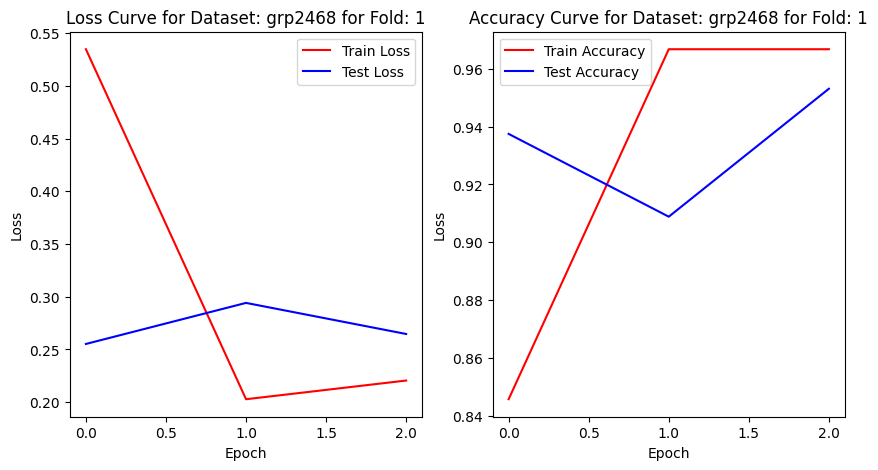

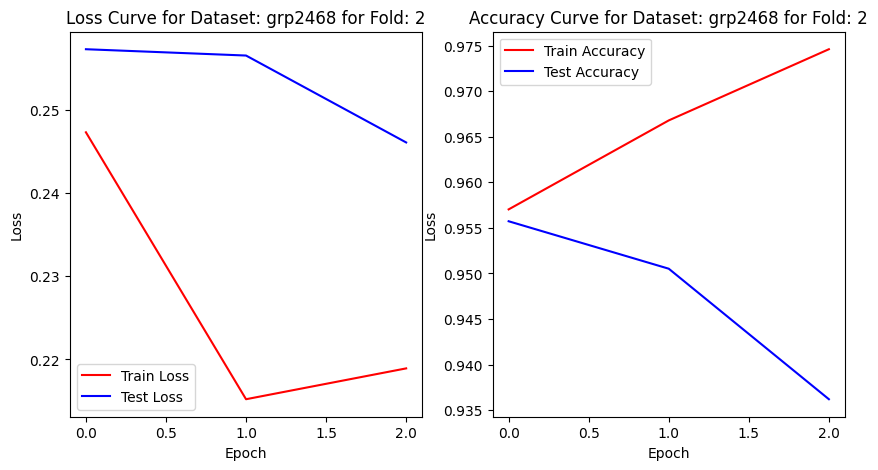

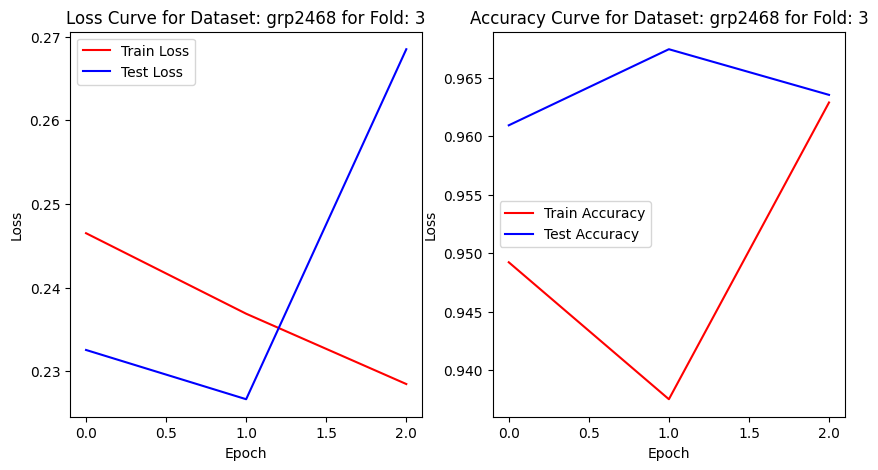

In [41]:
save_loss_curves_5class(five_class_results, "grp2468")

# Custom Model for Classification

In [42]:
class CustomModel(nn.Module):
    def __init__(self, noc:int):
        super().__init__()
        self.convblock1 = nn.Sequential(
            nn.Conv2d(in_channels=3,
                      out_channels=8,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3)
        )
        self.convblock2 = nn.Sequential(
            nn.Conv2d(in_channels=8,
                      out_channels=16,
                      kernel_size=2,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3)
        )
        self.convblock3 = nn.Sequential(
            nn.Conv2d(in_channels=16,
                      out_channels=32,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(in_features=4608,
                      out_features=noc)
        )
        
    def forward(self, x):
        x = self.convblock1(x)
#         print(x.shape)
        x = self.convblock2(x)
#         print(x.shape)
        x = self.convblock3(x)
#         print(x.shape)
        x = self.classifier(x)
        return x

## For One Vs Rest Classification

### Creating the Model

In [43]:
ovr_custom_model = CustomModel(noc=2)

In [44]:
ovr_custom_model.to(device)

CustomModel(
  (convblock1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(2, 2), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4608, out_features=2, bias=True)
  )
)

In [45]:
summary(model=ovr_custom_model,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
CustomModel (CustomModel)                [32, 3, 224, 224]    [32, 2]              --                   True
├─Sequential (convblock1)                [32, 3, 224, 224]    [32, 8, 74, 74]      --                   True
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 8, 224, 224]    224                  True
│    └─ReLU (1)                          [32, 8, 224, 224]    [32, 8, 224, 224]    --                   --
│    └─MaxPool2d (2)                     [32, 8, 224, 224]    [32, 8, 74, 74]      --                   --
├─Sequential (convblock2)                [32, 8, 74, 74]      [32, 16, 25, 25]     --                   True
│    └─Conv2d (0)                        [32, 8, 74, 74]      [32, 16, 75, 75]     528                  True
│    └─ReLU (1)                          [32, 16, 75, 75]     [32, 16, 75, 75]     --                   --
│    └─MaxPool2d (2)

### Setting up transforms, loss_function and optimizer

In [49]:
ovr_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

In [50]:
loss_function = torch.nn.CrossEntropyLoss()
custom_optimizer_ovr = torch.optim.SGD(params=ovr_custom_model.parameters(),
                            lr=0.1)

### Running the Model

In [52]:
index = random.choice(range(90))
ovr_results = one_vs_rest_classification(data_dir, index, ovr_custom_model,'Custom Model', device, ovr_transforms, custom_optimizer_ovr, loss_function, epochs=5, n_splits=3)

One Label:  cat
Epoch: 0 | Train loss: 0.3779 | Train acc: 0.8683 | Test loss: 0.3289 | Test acc: 0.9038
Epoch: 1 | Train loss: 0.3350 | Train acc: 0.8992 | Test loss: 0.3155 | Test acc: 0.9038
Epoch: 2 | Train loss: 0.3431 | Train acc: 0.9000 | Test loss: 0.3572 | Test acc: 0.8958
Epoch: 3 | Train loss: 0.3449 | Train acc: 0.8992 | Test loss: 0.3519 | Test acc: 0.8878
Epoch: 4 | Train loss: 0.3328 | Train acc: 0.8983 | Test loss: 0.3691 | Test acc: 0.8878
For Fold - 1
[[178   0]
 [ 20   0]]
Epoch: 0 | Train loss: 0.3542 | Train acc: 0.8892 | Test loss: 0.2838 | Test acc: 0.9151
Epoch: 1 | Train loss: 0.3476 | Train acc: 0.8883 | Test loss: 0.2959 | Test acc: 0.9231
Epoch: 2 | Train loss: 0.3592 | Train acc: 0.8883 | Test loss: 0.2968 | Test acc: 0.9151
Epoch: 3 | Train loss: 0.3383 | Train acc: 0.8900 | Test loss: 0.2652 | Test acc: 0.9231
Epoch: 4 | Train loss: 0.3579 | Train acc: 0.8883 | Test loss: 0.2933 | Test acc: 0.9151
For Fold - 2
[[182   0]
 [ 16   0]]
Epoch: 0 | Train loss:

## For 5-class Classification

### Creating the Model

In [53]:
fivec_custom_model = CustomModel(noc=5)
fivec_custom_model.to(device)

CustomModel(
  (convblock1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(2, 2), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=3, stride=3, padding=0, dilation=1, ceil_mode=False)
  )
  (convblock3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4608, out_features=5, bias=True)
  )
)

In [54]:
summary(model=fivec_custom_model,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
CustomModel (CustomModel)                [32, 3, 224, 224]    [32, 5]              --                   True
├─Sequential (convblock1)                [32, 3, 224, 224]    [32, 8, 74, 74]      --                   True
│    └─Conv2d (0)                        [32, 3, 224, 224]    [32, 8, 224, 224]    224                  True
│    └─ReLU (1)                          [32, 8, 224, 224]    [32, 8, 224, 224]    --                   --
│    └─MaxPool2d (2)                     [32, 8, 224, 224]    [32, 8, 74, 74]      --                   --
├─Sequential (convblock2)                [32, 8, 74, 74]      [32, 16, 25, 25]     --                   True
│    └─Conv2d (0)                        [32, 8, 74, 74]      [32, 16, 75, 75]     528                  True
│    └─ReLU (1)                          [32, 16, 75, 75]     [32, 16, 75, 75]     --                   --
│    └─MaxPool2d (2)

### Setting up transforms, loss function and optimizers

In [55]:
fivec_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
])

In [56]:
loss_function = torch.nn.CrossEntropyLoss()
custom_optimizer_fivec = torch.optim.SGD(params=fivec_custom_model.parameters(),
                            lr=0.1)

### Running the model

In [57]:
list_idxs = [2, 4, 6, 8]
five_class_results = five_class_classification(data_dir, list_idxs, fivec_custom_model, "Custom Model", device, fivec_transforms, custom_optimizer_fivec, loss_function, epochs=3)

Group Classes:  ['fox', 'hedgehog', 'snake', 'horse']
For Fold: 1 

Epoch: 0 | Train loss: 1.1820 | Train acc: 0.6660 | Test loss: 1.2363 | Test acc: 0.6667
Epoch: 1 | Train loss: 1.0804 | Train acc: 0.6875 | Test loss: 1.2138 | Test acc: 0.6680
Epoch: 2 | Train loss: 1.0785 | Train acc: 0.6914 | Test loss: 1.1281 | Test acc: 0.6667
For Fold - 1
[[168   0   0   0   0]
 [ 24   0   0   0   0]
 [ 18   0   0   0   0]
 [ 25   0   0   0   0]
 [ 17   0   0   0   0]]
For Fold: 2 

Epoch: 0 | Train loss: 1.1221 | Train acc: 0.6699 | Test loss: 1.0819 | Test acc: 0.7122
Epoch: 1 | Train loss: 1.1113 | Train acc: 0.6660 | Test loss: 1.0390 | Test acc: 0.7135
Epoch: 2 | Train loss: 1.1092 | Train acc: 0.6660 | Test loss: 0.9732 | Test acc: 0.7161
For Fold - 2
[[180   0   0   0   0]
 [ 17   0   0   0   0]
 [ 20   0   0   0   0]
 [ 15   0   0   0   0]
 [ 20   0   0   0   0]]
For Fold: 3 

Epoch: 0 | Train loss: 1.0742 | Train acc: 0.6895 | Test loss: 1.1076 | Test acc: 0.6706
Epoch: 1 | Train loss: 

# Visualizing Feature maps of Custom Model

In [58]:
def visualizing_feature_maps(model, img, transforms, device):
    no_of_layers = 0
    conv_layers = []
    outputs = []
    model_children = list(model.children())
    for child in model_children:
        if type(child) == nn.Sequential:
            for layer in child.children():
                if type(layer) == nn.Conv2d:
                    no_of_layers += 1
                    conv_layers.append(layer)
    
    vis_img = transforms(img).unsqueeze(0).to(device)
    
    outputs.append(conv_layers[0](vis_img))
    for i in range(1, len(conv_layers)):
        outputs.append(conv_layers[i](outputs[-1]))
    
    for num_layer in range(len(outputs)):
        plt.figure(figsize=(50, 10))
        layer_vis = outputs[num_layer].squeeze()
        print("Layer ", num_layer+1)
        for i, f in enumerate(layer_vis):
            plt.subplot(4, 8, i+1)
            plt.imshow(f.detach().cpu().numpy())
            plt.axis("off")
    
        plt.show()
        
    return outputs, conv_layers

Layer  1


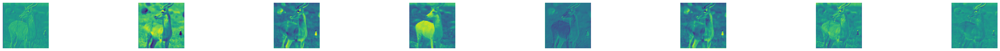

Layer  2


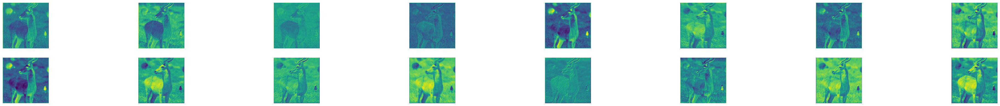

Layer  3


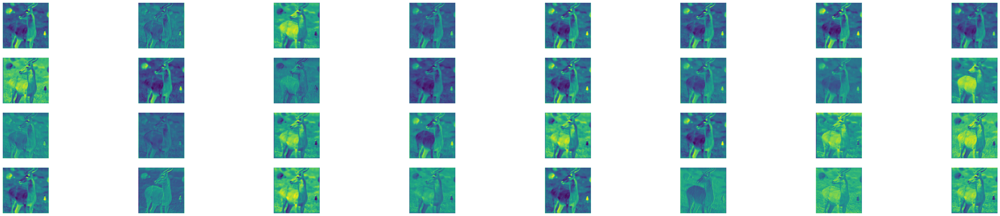

In [64]:
ovr_outputs, ovr_conv_layers = visualizing_feature_maps(ovr_custom_model, ovrdataset.load_image(56), ovr_transforms, device)

Layer  1


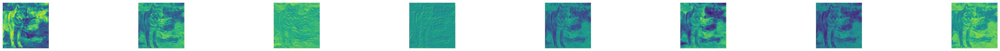

Layer  2


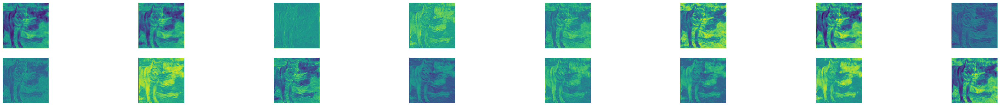

Layer  3


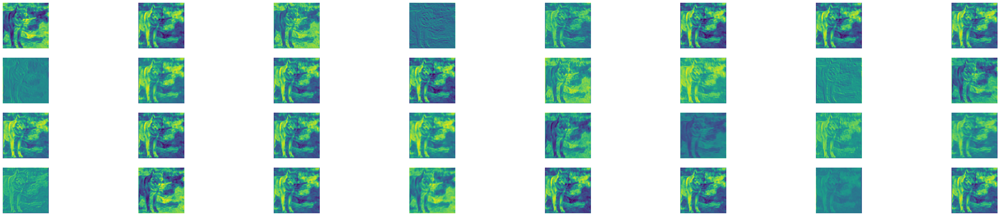

In [65]:
fivec_outputs, fivec_conv_layers = visualizing_feature_maps(fivec_custom_model, fivec_dataset.load_image(74), fivec_transforms, device)